<a href="https://colab.research.google.com/github/Rohan5076/practice-code/blob/main/Twitter_Sentiment_Analysis_analyticsvidhya.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
#importing req. Lib.
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import re
import nltk
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split
from mlxtend.plotting import plot_confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

In [3]:
#loading the data set
train=pd.read_csv("/content/drive/MyDrive/All CSV files-20220711T101939Z-001/tweet/train_E6oV3lV.csv")
test=pd.read_csv("/content/drive/MyDrive/All CSV files-20220711T101939Z-001/tweet/test_tweets_anuFYb8.csv")




In [4]:

train.shape,test.shape

((31962, 3), (17197, 2))

In [5]:
train["label"].value_counts()

0    29720
1     2242
Name: label, dtype: int64

In [6]:
train.info(),test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31962 entries, 0 to 31961
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      31962 non-null  int64 
 1   label   31962 non-null  int64 
 2   tweet   31962 non-null  object
dtypes: int64(2), object(1)
memory usage: 749.2+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17197 entries, 0 to 17196
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      17197 non-null  int64 
 1   tweet   17197 non-null  object
dtypes: int64(1), object(1)
memory usage: 268.8+ KB


(None, None)

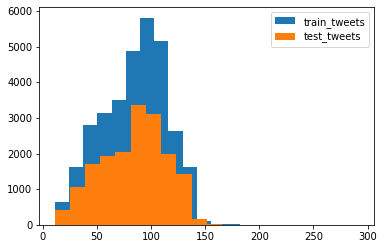

In [7]:
length_train=train['tweet'].str.len()
length_test=test['tweet'].str.len()
plt.hist(length_train,bins=20,label="train_tweets")
plt.hist(length_test,bins=20,label="test_tweets")
plt.legend()
plt.show()

In [8]:
data=train.append(test,ignore_index=True)
data.shape

(49159, 3)

Text(0.5, 1.0, 'Count of Type of Sentiment')

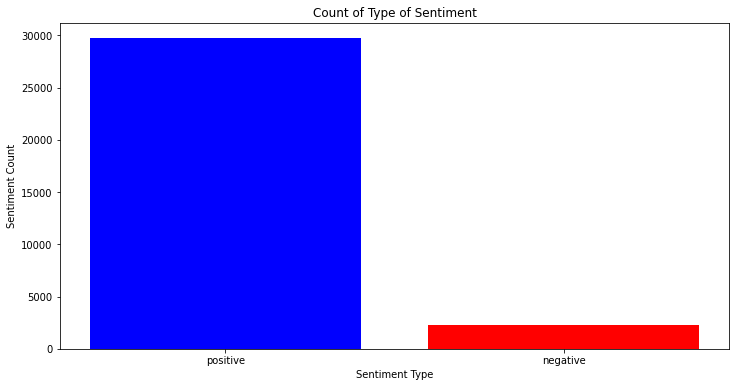

In [9]:
counter = data.label.value_counts()
index = [1,2]
plt.figure(1,figsize=(12,6))
plt.bar(index,counter,color=['blue','red',])
plt.xticks(index,['positive','negative'],rotation=0)
plt.xlabel('Sentiment Type')
plt.ylabel('Sentiment Count')
plt.title('Count of Type of Sentiment')

In [10]:
def remove_pattern(input_txt,pattern):
  r=re.findall(pattern,input_txt)
  for i in r:
    input_txt=re.sub(i,'',input_txt)
  return input_txt

In [11]:
data['clean_tweet']=np.vectorize(remove_pattern)(data['tweet'],"@[\w]*")
data.head()

,id,label,tweet,clean_tweet
0,1,0.0,@user when a father is dysfunctional and is s...,when a father is dysfunctional and is so sel...
1,2,0.0,@user @user thanks for #lyft credit i can't us...,thanks for #lyft credit i can't use cause th...
2,3,0.0,bihday your majesty,bihday your majesty
3,4,0.0,#model i love u take with u all the time in ...,#model i love u take with u all the time in ...
4,5,0.0,factsguide: society now #motivation,factsguide: society now #motivation


In [12]:
def tweet_to_words(tweet):
    letters_only = re.sub("[^a-zA-Z#]", " ",tweet) 
    words = letters_only.lower().split()                             
    stops = set(stopwords.words("english"))                  
    meaningful_words = [w for w in words if not w in stops] 
    return( " ".join( meaningful_words ))

In [13]:
nltk.download('stopwords')
data['clean_tweet']=data['clean_tweet'].apply(lambda x: tweet_to_words(x))
data['clean_tweet']=data['clean_tweet'].apply(lambda x:' '.join([w for w in x.split() if len(w)>3]))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [14]:
data.head

<bound method NDFrame.head of           id  label                                              tweet  \
0          1    0.0   @user when a father is dysfunctional and is s...   
1          2    0.0  @user @user thanks for #lyft credit i can't us...   
2          3    0.0                                bihday your majesty   
3          4    0.0  #model   i love u take with u all the time in ...   
4          5    0.0             factsguide: society now    #motivation   
...      ...    ...                                                ...   
49154  49155    NaN  thought factory: left-right polarisation! #tru...   
49155  49156    NaN  feeling like a mermaid ð #hairflip #neverre...   
49156  49157    NaN  #hillary #campaigned today in #ohio((omg)) &am...   
49157  49158    NaN  happy, at work conference: right mindset leads...   
49158  49159    NaN  my   song "so glad" free download!  #shoegaze ...   

                                             clean_tweet  
0      father dysfunct

In [15]:
import pandas as pd
data.to_csv('clean_data.csv', index=False)

In [16]:
data.head()

,id,label,tweet,clean_tweet
0,1,0.0,@user when a father is dysfunctional and is s...,father dysfunctional selfish drags kids dysfun...
1,2,0.0,@user @user thanks for #lyft credit i can't us...,thanks #lyft credit cause offer wheelchair van...
2,3,0.0,bihday your majesty,bihday majesty
3,4,0.0,#model i love u take with u all the time in ...,#model love take time
4,5,0.0,factsguide: society now #motivation,factsguide society #motivation


#**Tokenization**
Tokenization means splitting text into meaningful unit words. There are sentence tokenizers as well as word tokenizers.

Sentence tokenizer splits a paragraph into meaningful sentences, while word tokenizer splits a sentence into unit meaningful words. Many libraries can perform tokenization like SpaCy, NLTK, and TextBlob.

Splitting a sentence on space to get individual unit words can be understood as tokenization.

In [17]:
%%time
tokenized_tweet=data["clean_tweet"].apply(lambda x: x.split())
tokenized_tweet.head()

CPU times: user 180 ms, sys: 23.9 ms, total: 203 ms
Wall time: 205 ms


0    [father, dysfunctional, selfish, drags, kids, ...
1    [thanks, #lyft, credit, cause, offer, wheelcha...
2                                    [bihday, majesty]
3                           [#model, love, take, time]
4                   [factsguide, society, #motivation]
Name: clean_tweet, dtype: object

#**Stemming**
Stemming is converting words into their root word using some set of rules irrespective of meaning. I.e.,

* “fish,” “fishes,” and “fishing” are stemmed into “fish”.
* “playing”, “played”,” plays” are stemmed into “play”.
* Stemming helps to reduce the vocabulary hence improving the accuracy.

The simplest way to perform stemming is to use NLTK or a TextBlob library.

NLTK provides various stemming techniques, i.e. Snowball, PorterStemmer; different technique follows different sets of rules to convert words into their root word

In [18]:
%%time
import nltk
# “article” is stemmed into “articl“, “lives“ — -> “live“.
from nltk.stem import PorterStemmer
steamer = PorterStemmer()
tokenized_tweet=tokenized_tweet.apply(lambda x:[steamer.stem(i) for i in x]) #steaming

CPU times: user 7.79 s, sys: 85.7 ms, total: 7.87 s
Wall time: 7.91 s


In [19]:
%%time
for i in range(len(tokenized_tweet)):
  tokenized_tweet[i]=' '.join(tokenized_tweet[i])
data['clean_tweet']=tokenized_tweet

CPU times: user 465 ms, sys: 1.12 ms, total: 466 ms
Wall time: 468 ms


In [20]:
from wordcloud import WordCloud
from wordcloud import STOPWORDS  
import matplotlib.pyplot as plt


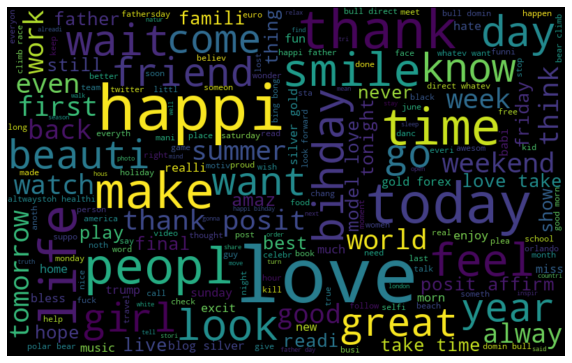

CPU times: user 4.51 s, sys: 173 ms, total: 4.68 s
Wall time: 4.72 s


In [21]:
%%time
all_words=' '.join([text for text in data['clean_tweet']])
wordcloud = WordCloud(width = 800, height = 500,random_state=21,max_font_size=110).generate(all_words)
plt.figure(figsize=(10,7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

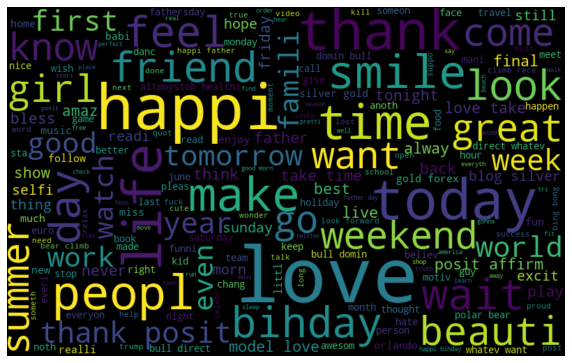

CPU times: user 3.1 s, sys: 90.6 ms, total: 3.19 s
Wall time: 3.21 s


In [22]:
%%time
normal_words=' '.join([text for text in data['clean_tweet'][data['label']==0]])
wordcloud = WordCloud(width = 800, height = 500,random_state=21,max_font_size=110).generate(normal_words)
plt.figure(figsize=(10,7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

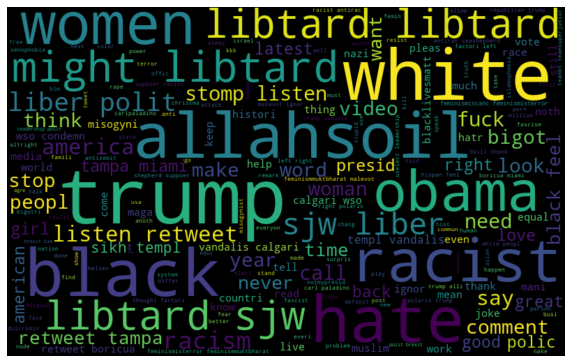

CPU times: user 1.17 s, sys: 83.9 ms, total: 1.25 s
Wall time: 1.26 s


In [23]:
%%time
negative_words=' '.join([text for text in data['clean_tweet'][data['label']==1]])
wordcloud = WordCloud(width = 800, height = 500,random_state=21,max_font_size=110).generate(negative_words)
plt.figure(figsize=(10,7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [24]:
#function to collect hashtag
def hashtag_extract(x):
  hashtag=[]
  #loop over the words in the tweet 
  for i in x:
    ht=re.findall(r"#(\w+)",i)
    hashtag.append(ht)
  return hashtag

In [25]:
# extracting hastags from non racist/sexist tweets
HT_regular=hashtag_extract(data['tweet'][data['label']==0])  
# extracting hastags from non racist/sexist tweets
HT_negative=hashtag_extract(data['tweet'][data['label']==1])  
#unnesting list
HT_regular=sum(HT_regular,[]) 
HT_negative=sum(HT_negative,[])

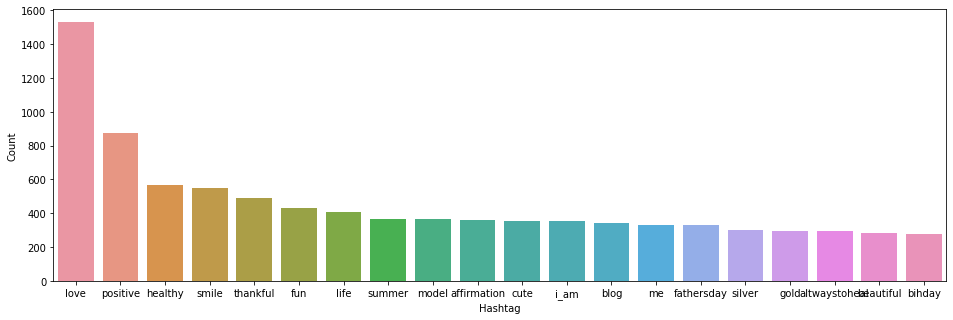

CPU times: user 341 ms, sys: 5.02 ms, total: 346 ms
Wall time: 343 ms


In [26]:
%%time
a=nltk.FreqDist(HT_regular)
d=pd.DataFrame({'Hashtag':list(a.keys()),'Count':list(a.values())})
#selecting top 20 most fequesnt hastags
e = d.nlargest(columns="Count",n=20)
plt.figure(figsize=(16,5))
ax=sns.barplot(data=e,x="Hashtag",y="Count")
ax.set(ylabel='Count')
plt.show()

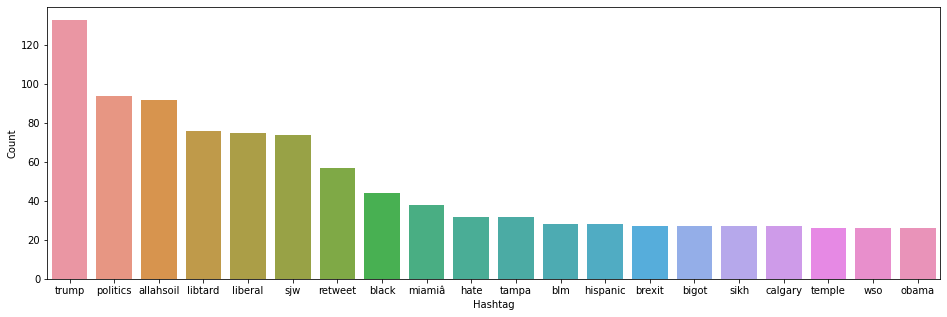

CPU times: user 271 ms, sys: 5.22 ms, total: 276 ms
Wall time: 277 ms


In [27]:
%%time
b=nltk.FreqDist(HT_negative)
g=pd.DataFrame({'Hashtag':list(b.keys()),'Count':list(b.values())})
#selecting top 20 most fequesnt hastags
f=g.nlargest(columns="Count",n=20)
plt.figure(figsize=(16,5))
ax=sns.barplot(data=f,x="Hashtag",y="Count")
ax.set(ylabel='Count')
plt.show()

In [28]:
from sklearn.feature_extraction.text import TfidfVectorizer,CountVectorizer
import gensim

In [29]:
bow_vectorizer=CountVectorizer(max_df=0.90,min_df=2,max_features=1000,stop_words='english')
bow=bow_vectorizer.fit_transform(data['clean_tweet'])
bow.shape

(49159, 1000)

In [30]:
data.count

<bound method DataFrame.count of           id  label                                              tweet  \
0          1    0.0   @user when a father is dysfunctional and is s...   
1          2    0.0  @user @user thanks for #lyft credit i can't us...   
2          3    0.0                                bihday your majesty   
3          4    0.0  #model   i love u take with u all the time in ...   
4          5    0.0             factsguide: society now    #motivation   
...      ...    ...                                                ...   
49154  49155    NaN  thought factory: left-right polarisation! #tru...   
49155  49156    NaN  feeling like a mermaid ð #hairflip #neverre...   
49156  49157    NaN  #hillary #campaigned today in #ohio((omg)) &am...   
49157  49158    NaN  happy, at work conference: right mindset leads...   
49158  49159    NaN  my   song "so glad" free download!  #shoegaze ...   

                                             clean_tweet  
0         father dy

In [31]:
tfidf_vectorizer=TfidfVectorizer(max_df=0.90,min_df=2,max_features=1000,stop_words='english')
tfidf=tfidf_vectorizer.fit_transform(data['clean_tweet'])
tfidf.shape

(49159, 1000)

In [32]:
tokenized_tweet=data['clean_tweet'].apply(lambda x:x.split())  #tokenizing
model_w2v=gensim.models.Word2Vec(tokenized_tweet,
                                 size=200,#desired no of features/independent variables
                                 window=5,#context window size
                                 min_count=2,
                                 sg= 1 ,# 1 for skip_gram model
                                 hs=0,
                                 negative=10 ,#for negative sampling
                                 workers=2, #no.of cores
                                 seed=34
                                 )
model_w2v.train(tokenized_tweet,total_examples=len(data['clean_tweet']),epochs=20)

(5810332, 6601800)

In [33]:
model_w2v.wv.most_similar(positive="dinner")

[('#biall', 0.5771301984786987),
 ('burrito', 0.5715593099594116),
 ('lukey', 0.5677073001861572),
 ('#burrito', 0.5640113949775696),
 ('kayak', 0.5629498958587646),
 ('#foodcoma', 0.5591048002243042),
 ('#cellar', 0.5586597919464111),
 ('noodl', 0.552040159702301),
 ('fav', 0.544732391834259),
 ('dess', 0.5436269640922546)]

In [34]:
model_w2v.wv.most_similar(positive="trump")

[('donald', 0.5950598120689392),
 ('#delegaterevolt', 0.5402591228485107),
 ('hillari', 0.537453293800354),
 ('#republican', 0.5355476140975952),
 ('melo', 0.5330601930618286),
 ('phoni', 0.5321771502494812),
 ('unstabl', 0.5299620628356934),
 ('tomlin', 0.5260895490646362),
 ('jibe', 0.5242252945899963),
 ('unfavor', 0.5220792293548584)]

In [35]:
model_w2v['food']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  """Entry point for launching an IPython kernel.


array([-2.62059629e-01, -5.60155213e-01, -1.78863585e-01,  8.66978228e-01,
       -1.03222899e-01, -7.05395639e-01, -3.35032232e-02,  8.65674838e-02,
       -5.22276342e-01, -7.38254726e-01, -1.01008087e-01, -3.12984407e-01,
        4.38703924e-01, -2.75492221e-01, -1.45724580e-01, -3.76324616e-02,
        5.78087986e-01,  1.85551018e-01, -1.01941802e-01, -3.19147617e-01,
       -8.19736481e-01, -2.50412524e-01, -8.97913650e-02,  3.88666660e-01,
       -1.83393776e-01, -2.80730665e-01, -5.15592456e-01, -4.21970934e-02,
       -2.52910972e-01,  8.92420486e-02,  4.89407271e-01,  6.31659865e-01,
       -1.94984511e-01, -1.23202831e-01, -1.72110811e-01,  2.60237176e-02,
       -2.96719939e-01, -2.76203096e-01, -1.40801656e+00,  2.10146029e-02,
       -7.63652384e-01, -4.64550465e-01, -1.03262536e-01,  4.11160201e-01,
        1.32561612e+00,  1.89543873e-01,  4.71217066e-01, -4.28203583e-01,
        2.68312488e-02,  3.38140160e-01, -5.88057399e-01,  9.30902809e-02,
       -1.78383753e-01, -

In [36]:
len(model_w2v['food'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  """Entry point for launching an IPython kernel.


200

In [37]:
def word_vector(tokens,size):
  vec=np.zeros(size).reshape((1,size))
  count=0
  for word in tokens:
    try:
      vec+=model_w2v[word].reshape((1,size))
      count+=1
    except KeyError:   # handling the case where the token is not in the vocabulary
       continue
  
  if count != 0:
    vec/= count
  return vec

  


preparing word2vec feature set...

In [38]:
wordvec_arrays=np.zeros((len(tokenized_tweet),200))
for i in range(len(tokenized_tweet)):
  wordvec_arrays[i,:]=word_vector(tokenized_tweet[i],200)
  wordvec_df=pd.DataFrame(wordvec_arrays)
wordvec_df.shape

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  


(49159, 200)

In [39]:
from tqdm import tqdm
tqdm.pandas(desc="progress- bar")
from gensim.models.doc2vec import LabeledSentence

In [40]:
def add_label(twt):
  output =[]
  for i,s in zip (twt.index,twt):
    output.append(LabeledSentence(s,["tweet_"+str(i)]))
  return output
labeled_tweets=add_label(tokenized_tweet)#label all the tweets

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: Call to deprecated `LabeledSentence` (Class will be removed in 4.0.0, use TaggedDocument instead).
  after removing the cwd from sys.path.


In [41]:
labeled_tweets[:6]

[LabeledSentence(words=['father', 'dysfunct', 'selfish', 'drag', 'kid', 'dysfunct', '#run'], tags=['tweet_0']),
 LabeledSentence(words=['thank', '#lyft', 'credit', 'caus', 'offer', 'wheelchair', 'van', '#disapoint', '#getthank'], tags=['tweet_1']),
 LabeledSentence(words=['bihday', 'majesti'], tags=['tweet_2']),
 LabeledSentence(words=['#model', 'love', 'take', 'time'], tags=['tweet_3']),
 LabeledSentence(words=['factsguid', 'societi', '#motiv'], tags=['tweet_4']),
 LabeledSentence(words=['huge', 'fare', 'talk', 'leav', 'chao', 'disput', '#allshowandnogo'], tags=['tweet_5'])]

In [42]:
model_d2v=gensim.models.Doc2Vec(dm=1, #dm=1 for "distributed memory model"
                                dm_mean=1,#dm=1 for using mean of the context word vectors
                                size=200, #no.of desired features
                                window=5,#width of the context window
                                negative=7,#if>0 then negative sampling will be used
                                min_counts=5,#ignores all words with total frequency lower than 2
                                workers=3, # no. of cores
                                alpha=0.1, #learning rate
                                seed=23)
model_d2v.build_vocab([i for i in tqdm(labeled_tweets)])
model_d2v.train(labeled_tweets,total_examples=len(data['clean_tweet']),epochs=15)


/usr/local/lib/python3.7/dist-packages/gensim/models/doc2vec.py:570: UserWarning: The parameter `size` is deprecated, will be removed in 4.0.0, use `vector_size` instead.
  warnings.warn("The parameter `size` is deprecated, will be removed in 4.0.0, use `vector_size` instead.")
100%|██████████| 49159/49159 [00:00<00:00, 2386681.37it/s]


In [43]:
docvec_arrays= np.zeros((len(tokenized_tweet),200))
for i in range (len(data)):
  docvec_arrays[i,:]= model_d2v.docvecs[i].reshape((1,200))
docvec_df=pd.DataFrame(docvec_arrays)
docvec_df.shape

(49159, 200)

# **Logistic Regression**

In [44]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score

In [45]:
# Extracting train and test BoW features 
train_bow=bow[:31962,:]
test_bow=bow[31962:,:]
#splitting data into training and validation set
xtrain_bow,xvalid_bow,ytrain,yvalid=train_test_split(train_bow,train['label'],random_state=42,test_size=0.3)
lreg=LogisticRegression()
#training the model
lreg.fit(xtrain_bow,ytrain)
prediction=lreg.predict_proba(xvalid_bow)   #predicting on the validtaion set 
prediction_int=prediction[:,1]>=0.3 #if prediction is greater than or equal to 0.3 than 1 or else 0
prediction_int .astype(np.int)
f1_score(yvalid,prediction_int) #calculationg prediction for validation set

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  # This is added back by InteractiveShellApp.init_path()


0.5345545378850958

now lets make prediction for the test dataset and create a submision file

In [46]:
test_pred=lreg.predict_proba(test_bow)
test_pred_int=test_pred[:,1]>=0.3
test_pred_int=test_pred_int.astype(np.int)
test['label']=test_pred_int
submission=test[['id','label']]
submission.to_csv('sub_lreg_bow.csv',index=False) #writing data to a csv file

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  This is separate from the ipykernel package so we can avoid doing imports until


**TF-IDF Features**

we'll follow the same steps as above,but now for the TF-IDF features set.

In [47]:
train_tfidf=tfidf[:31962,:]
test_tfidf=tfidf[31962:,:]
xtrain_tfidf=train_tfidf[ytrain.index]
xvalid_tfidf=train_tfidf[yvalid.index]

lreg.fit(xtrain_tfidf,ytrain)
prediction=lreg.predict_proba(xvalid_tfidf)
prediction_int=prediction[:,1]>=0.3
prediction_int=prediction_int.astype(np.int)
f1_score(yvalid,prediction_int)#calculating f1 score for the validation set

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if __name__ == '__main__':


0.5464190981432361

**word2vec features**

In [48]:
train_w2v=wordvec_df.iloc[:31962,:]
test_w2v=wordvec_df.iloc[31962:,:]
xtrain_w2v=train_w2v.iloc[ytrain.index]
xvalid_w2v=train_w2v.iloc[yvalid.index]

lreg.fit(xtrain_w2v,ytrain)
prediction=lreg.predict_proba(xvalid_w2v)
prediction_int=prediction[:,1]>=0.3
prediction_int=prediction_int.astype(np.int)
f1_score(yvalid,prediction_int)#calculating f1 score for the validation set

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if __name__ == '__main__':


0.6158315177923022

**Doc2Vec Features**

In [49]:
train_d2v=docvec_df.iloc[:31962,:]
test_d2v=docvec_df.iloc[31962:,:]
xtrain_d2v=train_d2v.iloc[ytrain.index]
xvalid_d2v=train_d2v.iloc[yvalid.index]

lreg.fit(xtrain_d2v,ytrain)
prediction=lreg.predict_proba(xvalid_d2v)
prediction_int=prediction[:,1]>=0.3
prediction_int=prediction_int.astype(np.int)
f1_score(yvalid,prediction_int)#calculating f1 score for the validation set

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if __name__ == '__main__':


0.3626666666666667

# SVM

In [50]:
from sklearn import svm

BAG WORD FEATURES

In [51]:
svc = svm.SVC(kernel='linear',C=1,probability=True).fit(xtrain_bow, ytrain)
prediction=svc.predict_proba(xvalid_bow)
prediction_int=prediction[:,1]>0.3
prediction_int=prediction_int.astype(np.int)
f1_score(yvalid,prediction_int)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  after removing the cwd from sys.path.


0.5046904315196998

In [52]:
test_pred=svc.predict_proba(test_bow)
test_pred_int=test_pred[:,1]>=0.3
test_pred_int=test_pred_int.astype(np.int)
test['label']=test_pred_int
submission=test[['id','label']]
submission.to_csv('sub_svm_bow.csv',index=False) #writing data to a csv file

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  This is separate from the ipykernel package so we can avoid doing imports until


**TF-IDF Features**


In [53]:
svc = svm.SVC(kernel='linear',C=1,probability=True).fit(xtrain_bow, ytrain)
prediction=svc.predict_proba(xvalid_tfidf)
prediction_int=prediction[:,1]>0.3
prediction_int=prediction_int.astype(np.int)
f1_score(yvalid,prediction_int)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  after removing the cwd from sys.path.


0.4376321353065539

word2vec Features

In [54]:
svc = svm.SVC(kernel='linear',C=1,probability=True).fit(xtrain_w2v, ytrain)
prediction=svc.predict_proba(xvalid_w2v)
prediction_int=prediction[:,1]>0.3
prediction_int=prediction_int.astype(np.int)
f1_score(yvalid,prediction_int)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  after removing the cwd from sys.path.


0.6133540372670806

In [55]:
svc = svm.SVC(kernel='linear',C=1,probability=True).fit(xtrain_d2v, ytrain)
prediction=svc.predict_proba(xvalid_d2v)
prediction_int=prediction[:,1]>0.3
prediction_int=prediction_int.astype(np.int)
f1_score(yvalid,prediction_int)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  after removing the cwd from sys.path.


0.24417314095449497

# Random Forest Classifier

In [56]:
from sklearn.ensemble import RandomForestClassifier

**bag of word features**

first we will train our Random Forest model on the bag of words features and check its performance on both validation set and public leaderboard

In [57]:
p=RandomForestClassifier(n_estimators = 400,random_state=11)
rf=p.fit(xtrain_bow,ytrain)
prediction=rf.predict(xvalid_bow)
#validation score
f1_score(yvalid,prediction)

0.5532591414944356

In [58]:
test_pred=rf.predict(test_bow)
test['label']=test_pred
submission=test[['id','label']]
submission.to_csv('sub_rf_bow.csv',index=False)

**TF-IDF Features**

In [59]:
rf=RandomForestClassifier(n_estimators = 400,random_state=11).fit(xtrain_tfidf,ytrain)
prediction=rf.predict(xvalid_tfidf)
#validation score
f1_score(yvalid,prediction)

0.5546372819100092

**Word2Vec Featues**

In [60]:
rf=RandomForestClassifier(n_estimators = 400,random_state=11).fit(xtrain_w2v,ytrain)
prediction=rf.predict(xvalid_w2v)
#validation score
f1_score(yvalid,prediction)

0.5141657922350472

**doc2vec features**

In [61]:
rf=RandomForestClassifier(n_estimators = 400,random_state=11).fit(xtrain_d2v,ytrain)
prediction=rf.predict(xvalid_d2v)
#validation score
f1_score(yvalid,prediction)

0.07584269662921349

In [62]:
from xgboost import XGBClassifier

bag of word features

# **XG-Boost model**

In [63]:
xgb_model=XGBClassifier(n_estimators = 1000,max_depth=6).fit(xtrain_bow,ytrain)
prediction=xgb_model.predict(xvalid_bow)
#validation score
f1_score(yvalid,prediction)

In [64]:
test_pred=xgb_model.predict(test_bow)
test['label']=test_pred
submission=test[['id','label']]
submission.to_csv('sub_xgb_bow.csv',index=False)

**TF-IDF FEATURES**

In [70]:
xgb=XGBClassifier(n_estimators = 1000,max_depth=6).fit(xtrain_tfidf,ytrain)
prediction=xgb.predict(xvalid_tfidf)
#validation score
f1_score(yvalid,prediction)

0.5181644359464628

**Word2Vec features**

In [71]:
xgb=XGBClassifier(n_estimators = 1000,max_depth=6,nthread=3).fit(xtrain_w2v,ytrain)
prediction=xgb.predict(xvalid_w2v)
#validation score
f1_score(yvalid,prediction)

0.6493273542600898

**Doc2Vec Features**

In [72]:
xgb=XGBClassifier(n_estimators = 1000,max_depth=6,nthread=3).fit(xtrain_d2v,ytrain)
prediction=xgb.predict(xvalid_d2v)
#validation score
f1_score(yvalid,prediction)

0.371523915461624

#**Fine tunning XGBoost + Word2Vec**

In [99]:
import xgboost as xgb

In [100]:
dtrain = xgb.DMatrix(xtrain_w2v, label=ytrain) 
dvalid = xgb.DMatrix(xvalid_w2v, label=yvalid) 
dtest = xgb.DMatrix(test_w2v)

In [101]:
# Parameters that we are going to tune 
params = {
    'objective':'binary:logistic',
    'max_depth':6,
    'min_child_weight': 1,
    'eta':.3,
    'subsample': 1,
    'colsample_bytree': 1
 }

we will create custom evaluation metric to calculate f1 score

In [102]:
def custom_eval(preds, dtrain):
    labels = dtrain.get_label().astype(np.int)
    preds = (preds >= 0.3).astype(np.int)
    return [('f1_score', f1_score(labels, preds))]

# **Tuning max_depth and min_child_weight**

In [103]:
#Tuning max_depth and min_child_weight

gridsearch_params = [
    (max_depth, min_child_weight)
    for max_depth in range(6,10)
     for min_child_weight in range(5,8)
 ]

In [104]:
%%time
max_f1 = 0. # initializing with 0 
best_params = None 
for max_depth, min_child_weight in gridsearch_params:
    print("CV with max_depth={}, min_child_weight={}".format(
                             max_depth,
                             min_child_weight))
     # Update our parameters
    params['max_depth'] = max_depth
    params['min_child_weight'] = min_child_weight

     # Cross-validation
    cv_results = xgb.cv(        params,
        dtrain,        feval= custom_eval,
        num_boost_round=200,
        maximize=True,
        seed=16,
        nfold=5,
        early_stopping_rounds=10
    )
    # Finding best F1 Score
    
    mean_f1 = cv_results['test-f1_score-mean'].max()
    
    boost_rounds = cv_results['test-f1_score-mean'].argmax()    
    print("\tF1 Score {} for {} rounds".format(mean_f1, boost_rounds))    
    if mean_f1 > max_f1:
        max_f1 = mean_f1
        best_params = (max_depth,min_child_weight)

print("Best params: {}, {}, F1 Score: {}".format(best_params[0], best_params[1], max_f1))


CV with max_depth=6, min_child_weight=5


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depreca

	F1 Score 0.6828796 for 58 rounds
CV with max_depth=6, min_child_weight=6


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depreca

	F1 Score 0.6809076000000001 for 47 rounds
CV with max_depth=6, min_child_weight=7


Streaming output truncated to the last 5000 lines.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Do

	F1 Score 0.6923836 for 85 rounds
CV with max_depth=7, min_child_weight=5


Streaming output truncated to the last 5000 lines.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Do

	F1 Score 0.6838072000000001 for 79 rounds
CV with max_depth=7, min_child_weight=6


Streaming output truncated to the last 5000 lines.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Do

	F1 Score 0.6892890000000002 for 79 rounds
CV with max_depth=7, min_child_weight=7


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depreca

	F1 Score 0.6787062 for 43 rounds
CV with max_depth=8, min_child_weight=5


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depreca

	F1 Score 0.688221 for 51 rounds
CV with max_depth=8, min_child_weight=6


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depreca

	F1 Score 0.6700592000000001 for 37 rounds
CV with max_depth=8, min_child_weight=7


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depreca

	F1 Score 0.6874832000000001 for 48 rounds
CV with max_depth=9, min_child_weight=5


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depreca

	F1 Score 0.688528 for 53 rounds
CV with max_depth=9, min_child_weight=6


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depreca

	F1 Score 0.6844558000000001 for 53 rounds
CV with max_depth=9, min_child_weight=7


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depreca

	F1 Score 0.6828718 for 41 rounds
Best params: 6, 7, F1 Score: 0.6923836
CPU times: user 52min 19s, sys: 10.4 s, total: 52min 30s
Wall time: 28min 55s


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depreca

updating max_depth and min_child_weight parameters.

In [105]:
#Updating max_depth and min_child_weight parameters.

params['max_depth'] = 7 
params['min_child_weight'] = 6

#**Tunning subsample and colsample**

In [ ]:
%%time
#Tuning subsample and colsample

gridsearch_params = [
    (subsample, colsample)
    for subsample in [i/10. for i in range(5,10)]
    for colsample in [i/10. for i in range(5,10)] ]
max_f1 = 0. 
best_params = None 
for subsample, colsample in gridsearch_params:
    print("CV with subsample={}, colsample={}".format(
                             subsample,
                             colsample))
     # Update our parameters
    params['colsample'] = colsample
    params['subsample'] = subsample
    cv_results = xgb.cv(
        params,
        dtrain,
        feval= custom_eval,
        num_boost_round=200,
        maximize=True,
        seed=16,
        nfold=5,
        early_stopping_rounds=10
    )
     # Finding best F1 Score
    mean_f1 = cv_results['test-f1_score-mean'].max()
    boost_rounds = cv_results['test-f1_score-mean'].argmax()
    print("\tF1 Score {} for {} rounds".format(mean_f1, boost_rounds))
    if mean_f1 > max_f1:
        max_f1 = mean_f1
        best_params = (subsample, colsample) 

print("Best params: {}, {}, F1 Score: {}".format(best_params[0], best_params[1], max_f1))


CV with subsample=0.5, colsample=0.5


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depreca

	F1 Score 0.6720278000000001 for 54 rounds
CV with subsample=0.5, colsample=0.6


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depreca

	F1 Score 0.6720278000000001 for 54 rounds
CV with subsample=0.5, colsample=0.7


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depreca

	F1 Score 0.6720278000000001 for 54 rounds
CV with subsample=0.5, colsample=0.8


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depreca

	F1 Score 0.6720278000000001 for 54 rounds
CV with subsample=0.5, colsample=0.9


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depreca

	F1 Score 0.6720278000000001 for 54 rounds
CV with subsample=0.6, colsample=0.5


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depreca

updating subsample and colsample_bytree

In [ ]:
#Updating subsample and colsample_bytree

params['subsample'] = .8
params['colsample_bytree'] = .5

#**Now lets tune learning rate**

In [ ]:
%%time
# Now let’s tune the learning rate.
max_f1 = 0. 
best_params = None 
for eta in [.3, .2, .1, .05, .01, .005]:
    print("CV with eta={}".format(eta))
     # Update ETA
    params['eta'] = eta

     # Run CV
    cv_results = xgb.cv(
        params,
        dtrain,
        feval= custom_eval,
        num_boost_round=1000,
        maximize=True,
        seed=16,
        nfold=5,
        early_stopping_rounds=20
    )

     # Finding best F1 Score
    mean_f1 = cv_results['test-f1_score-mean'].max()
    boost_rounds = cv_results['test-f1_score-mean'].argmax()
    print("\tF1 Score {} for {} rounds".format(mean_f1, boost_rounds))
    if mean_f1 > max_f1:
        max_f1 = mean_f1
        best_params = eta 
print("Best params: {}, F1 Score: {}".format(best_params, max_f1))


In [ ]:
params['eta'] = .1

# Let’s have a look at the final list of tuned parameters.

In [ ]:
params
{'colsample': 0.8,
 'colsample_bytree': 0.5, 'eta': 0.1,
 'max_depth': 7, 'min_child_weight': 6,
 'objective': 'binary:logistic',
 'subsample': 0.8}

In [ ]:
%%time
xgb_model = xgb.train(
    params,
    dtrain,
    feval= custom_eval,
    num_boost_round= 1000,
    maximize=True,
    evals=[(dvalid, "Validation")],
    early_stopping_rounds=10
 )

# Let’s prepare one final predicion file.

In [ ]:
test_pred = xgb_model.predict(dtest) 
test['label'] = (test_pred >= 0.3).astype(np.int) 
submission = test[['id','label']] 
submission.to_csv('sub_xgb_w2v_finetuned.csv', index=False)

In [ ]:
submission